In [1]:
#Import libraries
#standard libraries for DA

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm, skew
from scipy import stats
import statsmodels.api as sm

#sklearn modules for data preprocessing:

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler 

#sklearn modules for Model Selection--------------------------------------

from sklearn import svm, tree, linear_model, neighbors
from sklearn import naive_bayes, ensemble, discriminant_analysis, gaussian_process
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
!pip install xgboost
from xgboost import XGBClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


#sklearn modules for Model Evaluation & Improvement---------------------------
    
from sklearn.metrics import confusion_matrix, accuracy_score 
from sklearn.metrics import f1_score, precision_score, recall_score, fbeta_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold

from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics

from sklearn.metrics import classification_report, precision_recall_curve
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import make_scorer, recall_score, log_loss
from sklearn.metrics import average_precision_score
  

#Standard libraries for data visualization---------------------

import seaborn as sn
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import matplotlib 
%matplotlib inline
color = sn.color_palette()
import matplotlib.ticker as mtick
from IPython.display import display
pd.options.display.max_columns = None
from pandas.plotting import scatter_matrix
from sklearn.metrics import roc_curve


#Miscellaneous Utilitiy Libraries--------------------------------------
    
import random
import os
import re
import sys
import timeit
import string
import time
from datetime import datetime
from time import time
from dateutil.parser import parse
import joblib


In [2]:
demo= pd.read_excel('Telco_customer_churn_demographics.xlsx')
loc= pd.read_excel('Telco_customer_churn_location.xlsx')
serv= pd.read_excel('Telco_customer_churn_services.xlsx')
stat= pd.read_excel('Telco_customer_churn_status.xlsx')

In [3]:
key = ['Customer ID']
df = stat.merge(  # Merge into a single dataframe
    demo, left_on=key, right_on=key).merge(
    serv, left_on=key, right_on=key).merge(
    loc, left_on=key, right_on=key)
df.head()

,Customer ID,Count_x,Quarter_x,Satisfaction Score,Customer Status,Churn Label,Churn Value,Churn Score,CLTV,Churn Category,Churn Reason,Count_y,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Count_x,Quarter_y,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Count_y,Country,State,City,Zip Code,Lat Long,Latitude,Longitude
0,8779-QRDMV,1,Q3,3,Churned,Yes,1,91,5433,Competitor,Competitor offered more data,1,Male,78,No,Yes,No,No,0,1,Q3,No,0,1,None,No,0.00,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65,1,United States,California,Los Angeles,90022,"34.02381, -118.156582",34.023810,-118.156582
1,7495-OOKFY,1,Q3,3,Churned,Yes,1,69,5302,Competitor,Competitor made better offer,1,Female,74,No,Yes,Yes,Yes,1,1,Q3,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,0.00,0,390.80,1024.10,1,United States,California,Los Angeles,90063,"34.044271, -118.185237",34.044271,-118.185237
2,1658-BYGOY,1,Q3,2,Churned,Yes,1,81,3179,Competitor,Competitor made better offer,1,Male,71,No,Yes,No,Yes,3,1,Q3,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88,1,United States,California,Los Angeles,90065,"34.108833, -118.229715",34.108833,-118.229715
3,4598-XLKNJ,1,Q3,2,Churned,Yes,1,88,5337,Dissatisfaction,Limited range of services,1,Female,78,No,Yes,Yes,Yes,1,1,Q3,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07,1,United States,California,Inglewood,90303,"33.936291, -118.332639",33.936291,-118.332639
4,4846-WHAFZ,1,Q3,2,Churned,Yes,1,67,2793,Price,Extra data charges,1,Female,80,No,Yes,Yes,Yes,1,1,Q3,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36,1,United States,California,Whittier,90602,"33.972119, -118.020188",33.972119,-118.020188


In [4]:
df.columns

Index(['Customer ID', 'Count_x', 'Quarter_x', 'Satisfaction Score',
       'Customer Status', 'Churn Label', 'Churn Value', 'Churn Score', 'CLTV',
       'Churn Category', 'Churn Reason', 'Count_y', 'Gender', 'Age',
       'Under 30', 'Senior Citizen', 'Married', 'Dependents',
       'Number of Dependents', 'Count_x', 'Quarter_y', 'Referred a Friend',
       'Number of Referrals', 'Tenure in Months', 'Offer', 'Phone Service',
       'Avg Monthly Long Distance Charges', 'Multiple Lines',
       'Internet Service', 'Internet Type', 'Avg Monthly GB Download',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
       'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing',
       'Payment Method', 'Monthly Charge', 'Total Charges', 'Total Refunds',
       'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Revenue', 'Count_y', 'Country', 'State', 'City', 'Zip Code',
      

In [5]:
to_drop = [  # Drop columns not used in the analyses
    'Customer ID',
    'Count_x',
    'Quarter_x',
    'Customer Status',
    'Churn Value',
    'Churn Score',
    'Churn Category',
    'Count_y',
    'Under 30','Senior Citizen',
    'Number of Dependents',
    'Quarter_y',
    'Referred a Friend',
    'Number of Referrals',
    'Phone Service',
  
    'Payment Method',
    'Total Refunds',
    'Churn Reason',
    'Country','State','City','Zip Code','Lat Long','Latitude','Longitude',
    
    'Total Revenue']
df.drop(to_drop, axis=1, inplace=True)

In [6]:
df.rename(columns={"Count_x": "Count","Tenure in Months":"Tenure"},inplace =True)
df

,Satisfaction Score,Churn Label,CLTV,Gender,Age,Married,Dependents,Tenure,Offer,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Monthly Charge,Total Charges,Total Extra Data Charges,Total Long Distance Charges
0,3,Yes,5433,Male,78,No,No,1,None,0.00,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,39.65,39.65,20,0.00
1,3,Yes,5302,Female,74,Yes,Yes,8,Offer E,48.85,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,80.65,633.30,0,390.80
2,2,Yes,3179,Male,71,No,Yes,18,Offer D,11.33,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,95.45,1752.55,0,203.94
3,2,Yes,5337,Female,78,Yes,Yes,25,Offer C,19.76,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,98.50,2514.50,0,494.00
4,2,Yes,2793,Female,80,Yes,Yes,37,Offer C,6.33,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,76.50,2868.15,0,234.21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,5,No,5306,Female,30,No,No,72,None,22.77,No,No,None,0,No,No,No,No,No,No,No,No,Two Year,Yes,21.15,1419.40,0,1639.44
7039,3,No,2140,Male,38,Yes,Yes,24,Offer C,36.05,Yes,Yes,Cable,24,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,One Year,Yes,84.80,1990.50,0,865.20
7040,4,No,5560,Female,30,Yes,Yes,72,None,29.66,Yes,Yes,Fiber Optic,59,No,Yes,Yes,No,Yes,Yes,Yes,Yes,One Year,Yes,103.20,7362.90,0,2135.52
7041,4,No,2793,Female,32,Yes,Yes,11,None,0.00,No,Yes,DSL,17,Yes,No,No,No,No,No,No,Yes,Month-to-Month,Yes,29.60,346.45,0,0.00


In [7]:
#df = df.T.drop_duplicates().T
df.drop_duplicates().T

0               1     \
Satisfaction Score                              3               3   
Churn Label                                   Yes             Yes   
CLTV                                         5433            5302   
Gender                                       Male          Female   
Age                                            78              74   
Married                                        No             Yes   
Dependents                                     No             Yes   
Tenure                                          1               8   
Offer                                        None         Offer E   
Avg Monthly Long Distance Charges               0           48.85   
Multiple Lines                                 No             Yes   
Internet Service                              Yes             Yes   
Internet Type                                 DSL     Fiber Optic   
Avg Monthly GB Download                         8              17   
Online Security                                No              No   
Online Backup                                  No             Yes   
Device Protection Plan                        Yes              No   
Premium Tech Support                           No              No   
Streaming TV                                   No              No   
Streaming Movies                              Yes              No   
Streaming Music                                No              No   
Unlimited Data                                 No             Yes   
Contract                           Month-to-Month  Month-to-Month   
Paperless Billing                             Yes             Yes   
Monthly Charge                              39.65           80.65   
Total Charges                               39.65           633.3   
Total Extra Data Charges                       20               0   
Total Long Distance Charges                     0           390.8   

                                             2               3     \
Satisfaction Score                              2               2   
Churn Label                                   Yes             Yes   
CLTV                                         3179            5337   
Gender                                       Male          Female   
Age                                            71              78   
Married                                        No             Yes   
Dependents                                    Yes             Yes   
Tenure                                         18              25   
Offer                                     Offer D         Offer C   
Avg Monthly Long Distance Charges           11.33           19.76   
Multiple Lines                                Yes              No   
Internet Service                              Yes             Yes   
Internet Type                         Fiber Optic     Fiber Optic   
Avg Monthly GB Download                        52              12   
Online Security                                No              No   
Online Backup                                  No             Yes   
Device Protection Plan                         No             Yes   
Premium Tech Support                           No              No   
Streaming TV                                  Yes             Yes   
Streaming Movies                              Yes             Yes   
Streaming Music                               Yes              No   
Unlimited Data                                Yes             Yes   
Contract                           Month-to-Month  Month-to-Month   
Paperless Billing                             Yes             Yes   
Monthly Charge                              95.45            98.5   
Total Charges                             1752.55          2514.5   
Total Extra Data Charges                        0               0   
Total Long Distance Charges                203.94             494   

                                         

In [8]:
df.dtypes

Satisfaction Score                     int64
Churn Label                           object
CLTV                                   int64
Gender                                object
Age                                    int64
Married                               object
Dependents                            object
Tenure                                 int64
Offer                                 object
Avg Monthly Long Distance Charges    float64
Multiple Lines                        object
Internet Service                      object
Internet Type                         object
Avg Monthly GB Download                int64
Online Security                       object
Online Backup                         object
Device Protection Plan                object
Premium Tech Support                  object
Streaming TV                          object
Streaming Movies                      object
Streaming Music                       object
Unlimited Data                        object
Contract  

In [9]:
df.isna().sum()# Check for missing values

Satisfaction Score                   0
Churn Label                          0
CLTV                                 0
Gender                               0
Age                                  0
Married                              0
Dependents                           0
Tenure                               0
Offer                                0
Avg Monthly Long Distance Charges    0
Multiple Lines                       0
Internet Service                     0
Internet Type                        0
Avg Monthly GB Download              0
Online Security                      0
Online Backup                        0
Device Protection Plan               0
Premium Tech Support                 0
Streaming TV                         0
Streaming Movies                     0
Streaming Music                      0
Unlimited Data                       0
Contract                             0
Paperless Billing                    0
Monthly Charge                       0
Total Charges            

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Satisfaction Score,7043.0,3.244924,1.201657,1.00,3.000,3.00,4.000,5.00
CLTV,7043.0,4400.295755,1183.057152,2003.00,3469.000,4527.00,5380.500,6500.00
Age,7043.0,46.509726,16.750352,19.00,32.000,46.00,60.000,80.00
Tenure,7043.0,32.386767,24.542061,1.00,9.000,29.00,55.000,72.00
Avg Monthly Long Distance Charges,7043.0,22.958954,15.448113,0.00,9.210,22.89,36.395,49.99
Avg Monthly GB Download,7043.0,20.515405,20.418940,0.00,3.000,17.00,27.000,85.00
Monthly Charge,7043.0,64.761692,30.090047,18.25,35.500,70.35,89.850,118.75
Total Charges,7043.0,2280.381264,2266.220462,18.80,400.150,1394.55,3786.600,8684.80
Total Extra Data Charges,7043.0,6.860713,25.104978,0.00,0.000,0.00,0.000,150.00
Total Long Distance Charges,7043.0,749.099262,846.660055,0.00,70.545,401.44,1191.100,3564.72


C:\Users\Nour\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


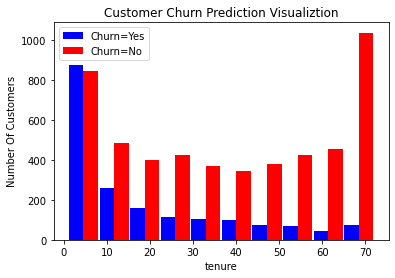

In [11]:
tenure_churn_no = df[df['Churn Label']=='No'].Tenure
tenure_churn_yes = df[df['Churn Label']=='Yes'].Tenure

plt.xlabel("tenure")
plt.ylabel("Number Of Customers")
plt.title("Customer Churn Prediction Visualiztion")


plt.hist([tenure_churn_yes, tenure_churn_no], rwidth=0.95, color=['blue','red'],label=['Churn=Yes','Churn=No'])
plt.legend()

In [12]:
tenure_churn_no = df[df['Churn Label']=='No'].Tenure
tenure_churn_no

476     71
477      2
478      1
479     43
480     25
        ..
7038    72
7039    24
7040    72
7041    11
7042    66
Name: Tenure, Length: 5174, dtype: int64

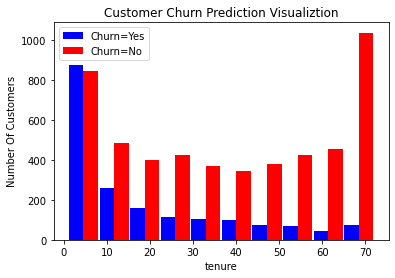

In [13]:
tenure_churn_no = df[df['Churn Label']=='No'].Tenure
tenure_churn_yes = df[df['Churn Label']=='Yes'].Tenure

plt.xlabel("tenure")
plt.ylabel("Number Of Customers")
plt.title("Customer Churn Prediction Visualiztion")


plt.hist([tenure_churn_yes, tenure_churn_no], rwidth=0.95, color=['blue','red'],label=['Churn=Yes','Churn=No'])
plt.legend()

In [14]:
def print_unique_col_values(df):
       for column in df:
            if df[column].dtypes=='object':
                print(f'{column}: {df[column].unique()}')

In [15]:
print_unique_col_values(df)

Churn Label: ['Yes' 'No']
Gender: ['Male' 'Female']
Married: ['No' 'Yes']
Dependents: ['No' 'Yes']
Offer: ['None' 'Offer E' 'Offer D' 'Offer C' 'Offer B' 'Offer A']
Multiple Lines: ['No' 'Yes']
Internet Service: ['Yes' 'No']
Internet Type: ['DSL' 'Fiber Optic' 'Cable' 'None']
Online Security: ['No' 'Yes']
Online Backup: ['No' 'Yes']
Device Protection Plan: ['Yes' 'No']
Premium Tech Support: ['No' 'Yes']
Streaming TV: ['No' 'Yes']
Streaming Movies: ['Yes' 'No']
Streaming Music: ['No' 'Yes']
Unlimited Data: ['No' 'Yes']
Contract: ['Month-to-Month' 'One Year' 'Two Year']
Paperless Billing: ['Yes' 'No']


In [16]:
#df.replace('No internet service','No',inplace=True)
#df.replace('No phone service','No',inplace=True)

In [17]:
print_unique_col_values(df)

Churn Label: ['Yes' 'No']
Gender: ['Male' 'Female']
Married: ['No' 'Yes']
Dependents: ['No' 'Yes']
Offer: ['None' 'Offer E' 'Offer D' 'Offer C' 'Offer B' 'Offer A']
Multiple Lines: ['No' 'Yes']
Internet Service: ['Yes' 'No']
Internet Type: ['DSL' 'Fiber Optic' 'Cable' 'None']
Online Security: ['No' 'Yes']
Online Backup: ['No' 'Yes']
Device Protection Plan: ['Yes' 'No']
Premium Tech Support: ['No' 'Yes']
Streaming TV: ['No' 'Yes']
Streaming Movies: ['Yes' 'No']
Streaming Music: ['No' 'Yes']
Unlimited Data: ['No' 'Yes']
Contract: ['Month-to-Month' 'One Year' 'Two Year']
Paperless Billing: ['Yes' 'No']


In [18]:
yes_no_columns = ['Churn Label','Married','Dependents','Multiple Lines','Internet Service','Online Security',
                   'Online Backup','Device Protection Plan','Premium Tech Support',
                   'Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Paperless Billing']
for col in yes_no_columns:
    df[col].replace({'Yes': 1,'No': 0},inplace=True)

In [19]:
for col in df:
    print(f'{col}: {df[col].unique()}')

Satisfaction Score: [3 2 1 4 5]
Churn Label: [1 0]
CLTV: [5433 5302 3179 ... 2770 4645 5553]
Gender: ['Male' 'Female']
Age: [78 74 71 80 72 76 66 70 77 65 67 68 69 79 75 73 37 19 31 23 38 21 29 61
 27 20 56 51 48 32 34 41 30 26 62 64 45 53 63 42 24 54 39 43 50 22 40 47
 60 52 55 59 49 58 25 28 33 44 57 46 36 35]
Married: [0 1]
Dependents: [0 1]
Tenure: [ 1  8 18 25 37 27 58 15  7 11  3 13 16 24  4 32 54  2 21 55  5 20 65 49
 43 56 52 33 30 46  9 10 35 44 62 14 12 17 39 68 34 22 19 23 42 41 57 38
 29 66 69 40 31 59 36 45 53 70 47 50 51 72 26  6 28 48 61 71 60 64 67 63]
Offer: ['None' 'Offer E' 'Offer D' 'Offer C' 'Offer B' 'Offer A']
Avg Monthly Long Distance Charges: [ 0.   48.85 11.33 ... 44.99 44.98  8.62]
Multiple Lines: [0 1]
Internet Service: [1 0]
Internet Type: ['DSL' 'Fiber Optic' 'Cable' 'None']
Avg Monthly GB Download: [ 8 17 52 12 14 18 30 24 19 29 28 11  9  7 15  2 10  5 13  0 27 26 22 25
 21 20  6 16 23  4  3 58 53 75 51 47 69 41 57 56 71 48 73 76 59 82 42 39
 85 46]
Onlin

In [20]:
df['Gender'].replace({'Female':1, 'Male':0},inplace=True)


In [21]:
df2 = pd.get_dummies(data=df, columns=['Internet Type','Contract','Offer'])
df2.columns

Index(['Satisfaction Score', 'Churn Label', 'CLTV', 'Gender', 'Age', 'Married',
       'Dependents', 'Tenure', 'Avg Monthly Long Distance Charges',
       'Multiple Lines', 'Internet Service', 'Avg Monthly GB Download',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
       'Streaming Music', 'Unlimited Data', 'Paperless Billing',
       'Monthly Charge', 'Total Charges', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Internet Type_Cable',
       'Internet Type_DSL', 'Internet Type_Fiber Optic', 'Internet Type_None',
       'Contract_Month-to-Month', 'Contract_One Year', 'Contract_Two Year',
       'Offer_None', 'Offer_Offer A', 'Offer_Offer B', 'Offer_Offer C',
       'Offer_Offer D', 'Offer_Offer E'],
      dtype='object')

In [22]:
df2

,Satisfaction Score,Churn Label,CLTV,Gender,Age,Married,Dependents,Tenure,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Paperless Billing,Monthly Charge,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Internet Type_Cable,Internet Type_DSL,Internet Type_Fiber Optic,Internet Type_None,Contract_Month-to-Month,Contract_One Year,Contract_Two Year,Offer_None,Offer_Offer A,Offer_Offer B,Offer_Offer C,Offer_Offer D,Offer_Offer E
0,3,1,5433,0,78,0,0,1,0.00,0,1,8,0,0,1,0,0,1,0,0,1,39.65,39.65,20,0.00,0,1,0,0,1,0,0,1,0,0,0,0,0
1,3,1,5302,1,74,1,1,8,48.85,1,1,17,0,1,0,0,0,0,0,1,1,80.65,633.30,0,390.80,0,0,1,0,1,0,0,0,0,0,0,0,1
2,2,1,3179,0,71,0,1,18,11.33,1,1,52,0,0,0,0,1,1,1,1,1,95.45,1752.55,0,203.94,0,0,1,0,1,0,0,0,0,0,0,1,0
3,2,1,5337,1,78,1,1,25,19.76,0,1,12,0,1,1,0,1,1,0,1,1,98.50,2514.50,0,494.00,0,0,1,0,1,0,0,0,0,0,1,0,0
4,2,1,2793,1,80,1,1,37,6.33,1,1,14,0,0,0,0,0,0,0,1,1,76.50,2868.15,0,234.21,0,0,1,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,5,0,5306,1,30,0,0,72,22.77,0,0,0,0,0,0,0,0,0,0,0,1,21.15,1419.40,0,1639.44,0,0,0,1,0,0,1,1,0,0,0,0,0
7039,3,0,2140,0,38,1,1,24,36.05,1,1,24,1,0,1,1,1,1,1,1,1,84.80,1990.50,0,865.20,1,0,0,0,0,1,0,0,0,0,1,0,0
7040,4,0,5560,1,30,1,1,72,29.66,1,1,59,0,1,1,0,1,1,1,1,1,103.20,7362.90,0,2135.52,0,0,1,0,0,1,0,1,0,0,0,0,0
7041,4,0,2793,1,32,1,1,11,0.00,0,1,17,1,0,0,0,0,0,0,1,1,29.60,346.45,0,0.00,0,1,0,0,1,0,0,1,0,0,0,0,0


In [23]:
cols_to_scale = ['CLTV','Tenure','Avg Monthly Long Distance Charges','Avg Monthly GB Download',
                 'Monthly Charge','Total Charges','Total Extra Data Charges','Total Long Distance Charges']

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df2[cols_to_scale] = scaler.fit_transform(df2[cols_to_scale])

In [24]:
for col in df2:
    print(f'{col}: {df2[col].unique()}')

Satisfaction Score: [3 2 1 4 5]
Churn Label: [1 0]
CLTV: [0.76273071 0.73360018 0.26150767 ... 0.17055815 0.58750278 0.78941517]
Gender: [0 1]
Age: [78 74 71 80 72 76 66 70 77 65 67 68 69 79 75 73 37 19 31 23 38 21 29 61
 27 20 56 51 48 32 34 41 30 26 62 64 45 53 63 42 24 54 39 43 50 22 40 47
 60 52 55 59 49 58 25 28 33 44 57 46 36 35]
Married: [0 1]
Dependents: [0 1]
Tenure: [0.         0.09859155 0.23943662 0.33802817 0.50704225 0.36619718
 0.8028169  0.1971831  0.08450704 0.14084507 0.02816901 0.16901408
 0.21126761 0.32394366 0.04225352 0.43661972 0.74647887 0.01408451
 0.28169014 0.76056338 0.05633803 0.26760563 0.90140845 0.67605634
 0.5915493  0.77464789 0.71830986 0.45070423 0.4084507  0.63380282
 0.11267606 0.12676056 0.47887324 0.6056338  0.85915493 0.18309859
 0.15492958 0.22535211 0.53521127 0.94366197 0.46478873 0.29577465
 0.25352113 0.30985915 0.57746479 0.56338028 0.78873239 0.52112676
 0.3943662  0.91549296 0.95774648 0.54929577 0.42253521 0.81690141
 0.49295775 0.6197

In [25]:
X= df2.drop('Churn Label',axis='columns')
y = df2['Churn Label']

In [26]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [27]:
import tensorflow as tf
from tensorflow import keras

In [28]:
#creat nureal network
model = keras.Sequential([
    keras.layers.Dense(26, input_shape=(37,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

# opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=100)

Epoch 1/100
177/177 [==============================] - 3s 1ms/step - loss: 0.7636 - accuracy: 0.6860
Epoch 2/100
177/177 [==============================] - 0s 882us/step - loss: 0.3529 - accuracy: 0.8628
Epoch 3/100
177/177 [==============================] - 0s 906us/step - loss: 0.2549 - accuracy: 0.9109
Epoch 4/100
177/177 [==============================] - 0s 790us/step - loss: 0.2040 - accuracy: 0.9246
Epoch 5/100
177/177 [==============================] - 0s 771us/step - loss: 0.1711 - accuracy: 0.9377
Epoch 6/100
177/177 [==============================] - 0s 1ms/step - loss: 0.1514 - accuracy: 0.9457
Epoch 7/100
177/177 [==============================] - 0s 776us/step - loss: 0.1403 - accuracy: 0.9460
Epoch 8/100
177/177 [==============================] - 0s 770us/step - loss: 0.1335 - accuracy: 0.9492
Epoch 9/100
177/177 [==============================] - 0s 754us/step - loss: 0.1318 - accuracy: 0.9483
Epoch 10/100
177/177 [==============================] - 0s 785us/step - loss:

177/177 [==============================] - 0s 765us/step - loss: 0.0979 - accuracy: 0.9583
Epoch 81/100
177/177 [==============================] - 0s 737us/step - loss: 0.0982 - accuracy: 0.9602
Epoch 82/100
177/177 [==============================] - 0s 737us/step - loss: 0.1005 - accuracy: 0.9572
Epoch 83/100
177/177 [==============================] - 0s 725us/step - loss: 0.0990 - accuracy: 0.9585
Epoch 84/100
177/177 [==============================] - 0s 748us/step - loss: 0.1010 - accuracy: 0.9560
Epoch 85/100
177/177 [==============================] - 0s 742us/step - loss: 0.0974 - accuracy: 0.9592
Epoch 86/100
177/177 [==============================] - 0s 742us/step - loss: 0.0976 - accuracy: 0.9576
Epoch 87/100
177/177 [==============================] - 0s 747us/step - loss: 0.0974 - accuracy: 0.9567
Epoch 88/100
177/177 [==============================] - 0s 735us/step - loss: 0.0981 - accuracy: 0.9595
Epoch 89/100
177/177 [==============================] - 0s 731us/step - loss:

In [29]:
model.evaluate(X_test, y_test)

45/45 [==============================] - 0s 1ms/step - loss: 0.0950 - accuracy: 0.9524


[0.09496735781431198, 0.9524485468864441]

In [30]:
yp = model.predict(X_test)
yp[:5]

array([[7.1683526e-04],
       [5.4996312e-03],
       [1.4990568e-04],
       [9.9710488e-01],
       [9.9955213e-01]], dtype=float32)

In [31]:
y_pred= []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)
        

In [32]:
#check the performance of the medole
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1042
           1       0.91      0.91      0.91       367

    accuracy                           0.95      1409
   macro avg       0.94      0.94      0.94      1409
weighted avg       0.95      0.95      0.95      1409



In [33]:
classification_report(y_test,y_pred)

'              precision    recall  f1-score   support\n\n           0       0.97      0.97      0.97      1042\n           1       0.91      0.91      0.91       367\n\n    accuracy                           0.95      1409\n   macro avg       0.94      0.94      0.94      1409\nweighted avg       0.95      0.95      0.95      1409\n'

Text(69.0, 0.5, 'Truth')

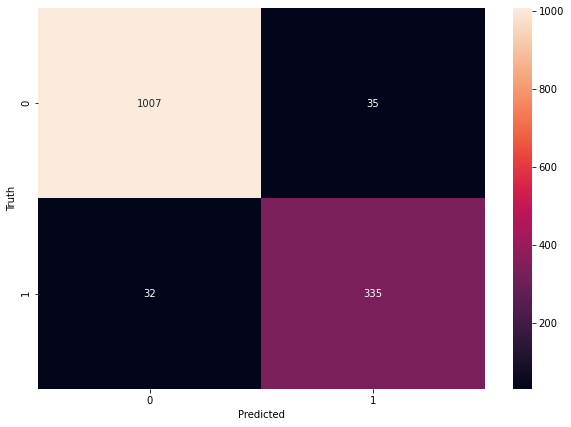

In [34]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')